# Leaky modes for Different Width Wall Hollow Core

Are they still conjugate to the (complex) guided mode pole locations?


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact, plotlogf
from scipy.optimize import newton
plt.style.use('dark_background')
%matplotlib widget


## Summary of Observations

- The determinant function plots the component $M_{2,2}$ of the transmission matrix when the keyword 'guided' is given to mode type, and it plots $M_{1,1}$ when the keyword 'leaky' is passed.  Based on studies below, these two components still appear to be conjugate.

- But the latter isn't what we want for leaky modes, we want to find the poles of the extension of the radiation integrand to the complex plane.  These poles sometimes occur at zeros of $M_{1,1}$, but also sometimes not, this depends on how the mode classes were chosen.

- We still need to analyze the pole locations for our choice of mode classes when they don't coincide with zeros of $M_{1,1}$.

# Setup Waveguide and input fields

In [2]:
Ts = [6.5, 2, 14, 3, 6.5]

A = SlabExact(scale=1e-5, Ts=Ts,
              ns=[1, 1.44, 1, 1.44, 1], xrefs=[200, 200, 400, 200, 200],
              symmetric=True, wl= 3.626513477156813e-05)

In [3]:
b = 1.25

def quadratic_piecewise(x):
    conds = [(x<-b), ((-b<=x)*(x<=b)), (x>b)]
    funcs = [0, lambda x: 1 - (x / b)**2, 0]
    return np.piecewise(x, conds, funcs)

f0 = quadratic_piecewise

## Zeros of $M_{2,2}$

I.e. the guided modes

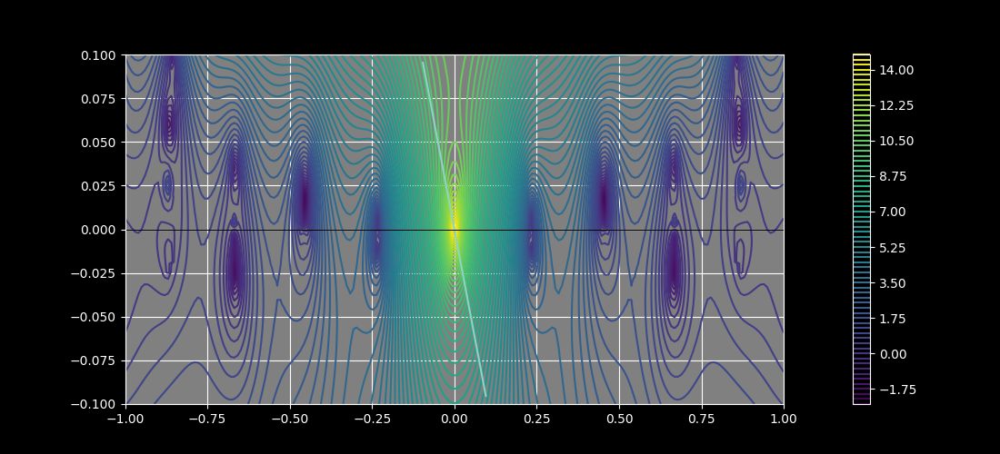

In [6]:
fig, ax = A.determinant_plot(-1, 1, -.1, .1, mode_type='leaky', plot_y_axis=False)

Find the zeros of $M_{1,1}$  and $M_{2,2}$ in complex plane

In [5]:
guesses = [
    .2-.01j,
    .43 - .02j,
    .66 - .04j,
    .87 - .065j,
]

In [6]:
Zs_guided = np.array([newton(A.determinant_Z, np.array(guess)) for guess in guesses])
Zs_leaky = np.array([newton(A.determinant_Z, np.array(guess.conjugate()), args=('TE', 'leaky')) for guess in guesses])

Find the difference between $M_{1,1}$ zeros and the conjugate of $M_{2,2}$ zeros.

In [7]:
Zs_leaky - Zs_guided.conj()

array([-1.38777878e-16+6.07153217e-18j, -5.55111512e-17-3.46944695e-18j,
       -3.33066907e-16+1.38777878e-17j, -1.11022302e-16-4.85722573e-17j])

That is below machine precision.  Next we do a visual representation

In [8]:
det_diff = lambda Z: A.determinant_Z(Z, mode_type='guided') - A.determinant_Z(Z.conj(), mode_type='leaky').conj()


/home/pv/local/slab/utilities.py:179: RuntimeWarning: divide by zero encountered in log
  ys = np.log(np.abs(ys))  # abs only needed if xy_plane=True


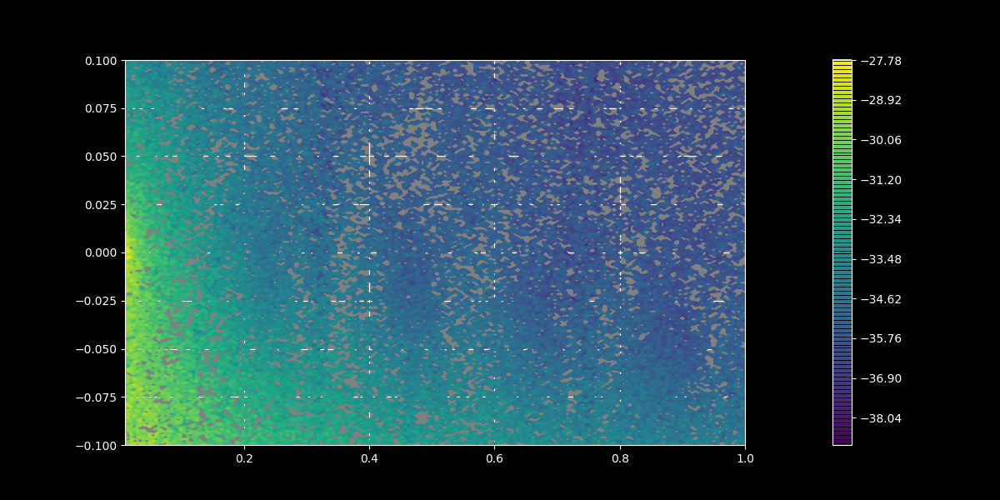

In [9]:
plotlogf(det_diff, .01, 1, -.1, .1, iref=200, rref=200, levels=200)

Actually appears $1,1$ component of $M(Z)$ and $2,2$ component of $M(\bar{Z}$ are conjugate everywhere.

## Examine spectral integrand

All of this though doesn't really help with leaky modes: those occur at poles of the spectral integrand.  So let's plot that (for specific x and z):

interactive(children=(FloatSlider(value=0.0, description='x', layout=Layout(width='90%'), max=16.0, min=-16.0,…

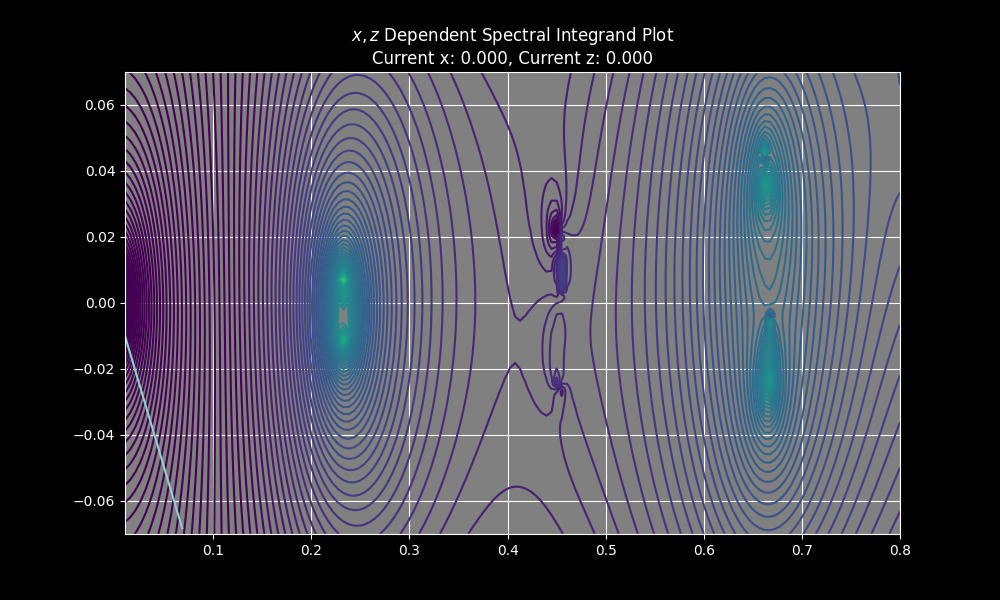

In [10]:
A.interactive_spectral_integrand_2d(f0, Lx=-b, Rx=b, rmin=.01, rmax=.8, imin=-.07, imax=.07,  rref=150, iref=150, levels=120)

Well that's a wacky wild world, let's look in on what appear to be two poles between the real values .2 and .3:

interactive(children=(FloatSlider(value=0.0, description='x', layout=Layout(width='90%'), max=16.0, min=-16.0,…

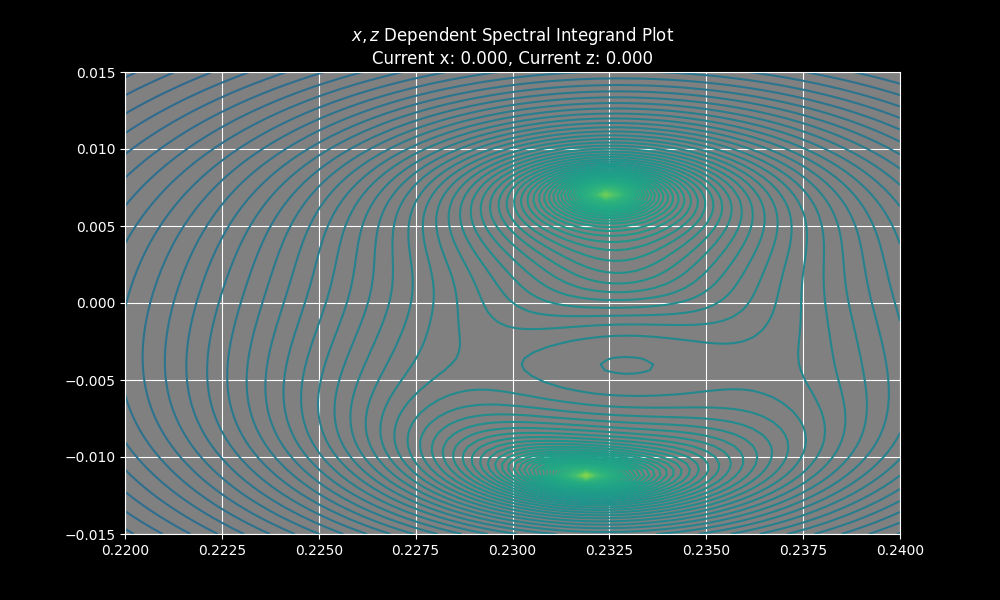

In [11]:
A.interactive_spectral_integrand_2d(f0, Lx=-b, Rx=b, rmin=.22, rmax=.24, imin=-.015, imax=.015, rref=80, iref=80)

In [12]:
guesses_2 = np.array([.2325,])

M11_zeros = [newton(A.determinant_Z, np.array(guess), args=('TE', 'leaky')) for guess in guesses_2]
M22_zeros = [newton(A.determinant_Z, np.array(guess), args=('TE', 'guided')) for guess in guesses_2]

for Z in M11_zeros:
    plt.plot(Z.real, Z.imag, marker='o', c='C3', markersize=5)

for Z in M22_zeros:
    plt.plot(Z.real, Z.imag, marker='o', c='C3', markersize=5)


## Observations

- The two poles aren't conjugate.

- The bottom pole also isn't simply associated with $M_{1, 1}$ as we thought

- The upper pole does coincide with a zero of $M_{2,2}$.

- As noted above, the zeros of $M_{1,1}$ and $M_{2,2}$ are conjugate.

# Try to capture field from pole above.

We first guess what the pole is and then try to capture, later we do the theory.

In [13]:
Propagator_ClassA = A.propagator()

In [18]:
P_leaky_A = [Propagator_ClassA(A.circular_contour(.2319-.01125j, 9e-5, 15), f0=f0, Lx=-b, Rx=b)]
P_leaky_A.extend([Propagator_ClassA(A.circular_contour(.2319-.01125j, 9e-5, 15), f0=f0, Lx=-b, Rx=b, sign=-1)])

In [19]:
x0 = 0
z0 = 0

leaky_A_x = lambda x: -sum([P.slice_propagate(x, z0, 'z') for P in P_leaky_A])
leaky_A_z = lambda z: -sum([P.slice_propagate(z, x0, 'x') for P in P_leaky_A])
Leaky_A = lambda x, z: -sum([P.propagate(x, z) for P in P_leaky_A])

Diff_Leaky_Full_A = lambda x,z: FullA(x,z) - Leaky_A(x,z)

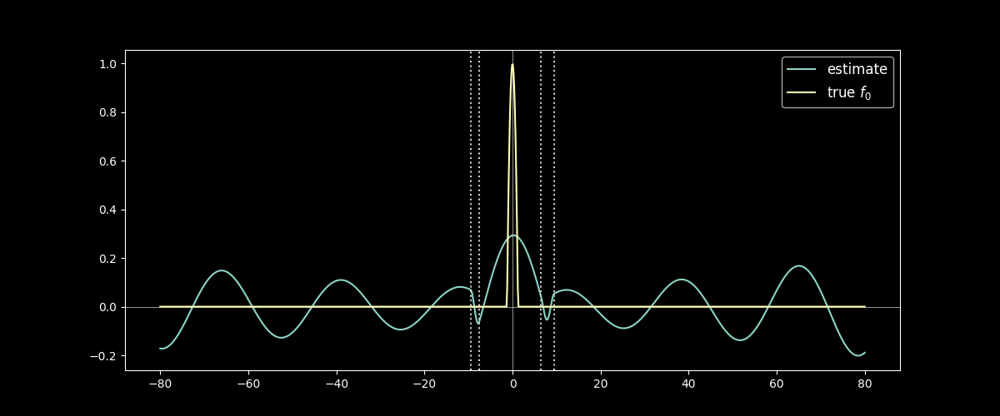

In [20]:
xs = np.linspace(-80, 80, 1000)
A.plot_field_1d(leaky_A_x, xs=xs, label='estimate') 
A.add_1d_plot(f0, xs=xs, label='true $f_0$')
# plt.gca().set_xlim(-3,3)

(<Figure size 1200x500 with 1 Axes>, <Axes: >)

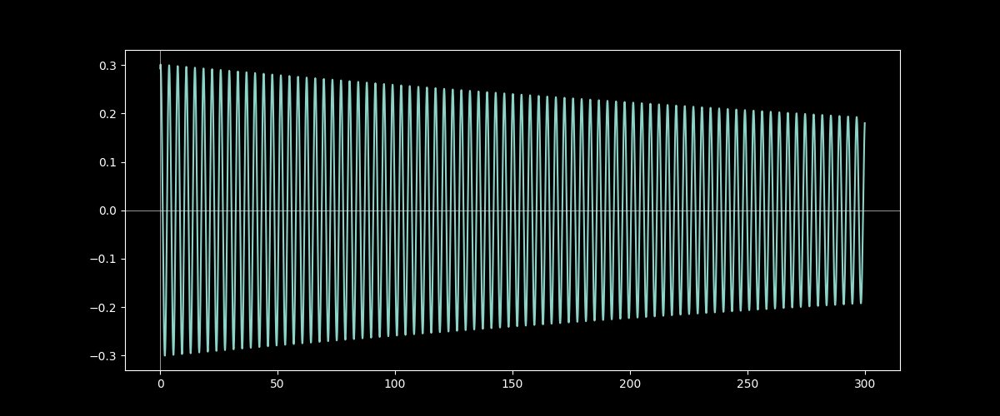

In [21]:
A.plot_field_1d(leaky_A_z, xs=np.linspace(0, 300, 5000),  plot_Rhos=False)

(<Figure size 900x393.75 with 2 Axes>, <Axes: >)

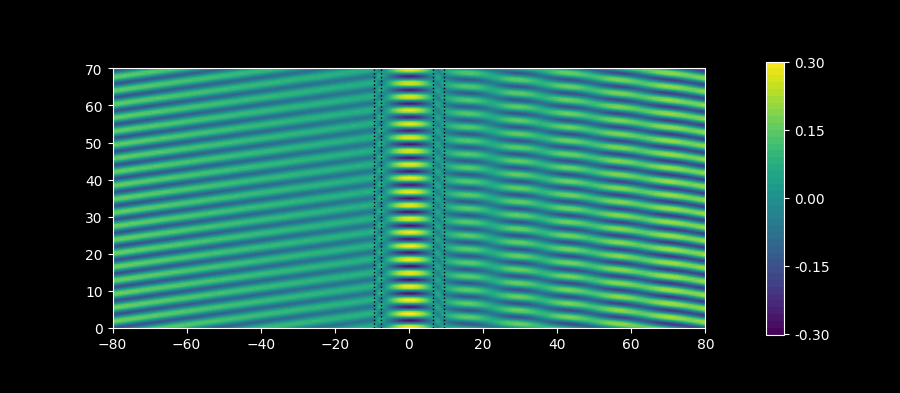

In [22]:
A.plot_field_2d(Leaky_A, xs=xs, zref=150, zmax=70)

# What about theory?

We could also examine the radiation transform for poles.  If they coincide with the the poles above, we know more about how to find them using the construction of the radiation modes.

In [23]:
A.radiation_transform?

Signature:
A.radiation_transform(
    Zs,
    f0,
    Lx=None,
    Rx=None,
    field_type='TE',
    sign='+1',
    paper_method=False,
    **intargs,
)
Docstring:
Return transform coefficients (alphas) for input field f0 from Zs using
scipy vectorized integration techniques.
File:      ~/local/slab/slab.py
Type:      method

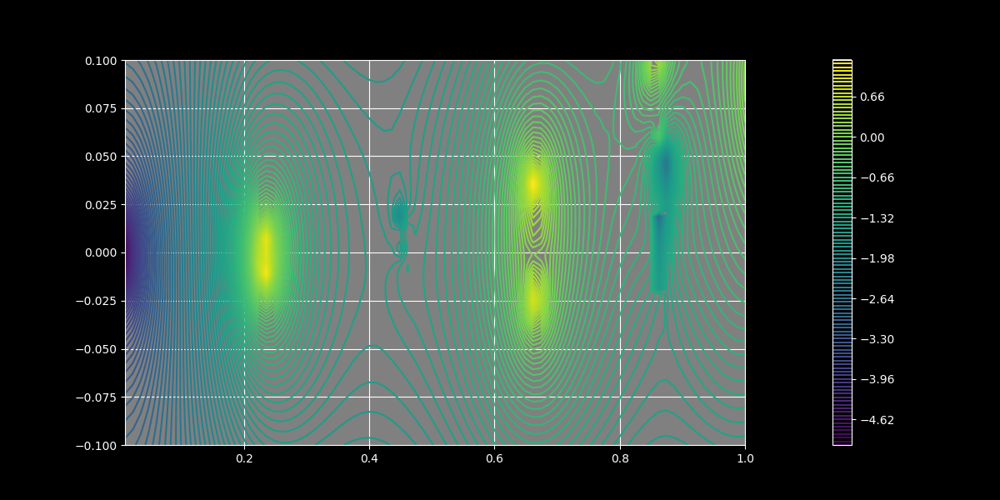

In [24]:
plotlogf(A.radiation_transform, .01, 1, -.1, .1, f0, -b, b, 'TE', '+1', False, iref=80, rref=80, levels=120)

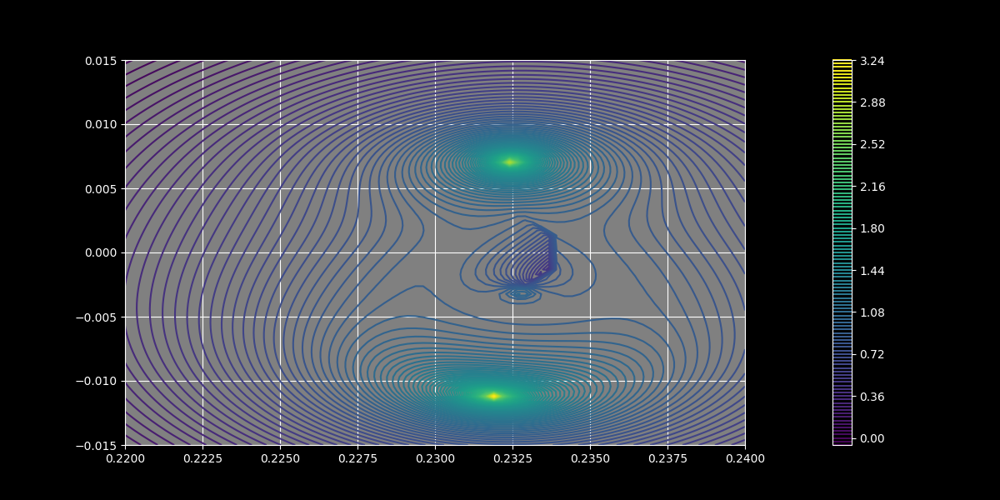

In [25]:
plotlogf(A.radiation_transform, .22, .24, -.015, .015, f0, -b, b, 'TE', '+1', False, iref=80, rref=80, levels=120)

In [39]:
def C1(Z, sign=+1):
    M = A.transmission_matrix_Z(Z)
    detM = A.transmission_determinant_Z(Z,)
    frac = (-M[..., 1, 0] * detM) / M[..., 0, 1]
    b = int(sign) * np.sqrt(frac, dtype=complex)
    C1 = b.conj() - M[..., 0, 1]
    return 1/C1


def M12(Z, sign=+1):
    M = A.transmission_matrix_Z(Z)
    return 1/M[..., 0, 1]

## Plot other possible poles from radiation mode normalization

We already know C2 above, it's just the poles associated with what we typically call leaky modes (which is great!).  But we want to know more about these other poles from C1 and factor.

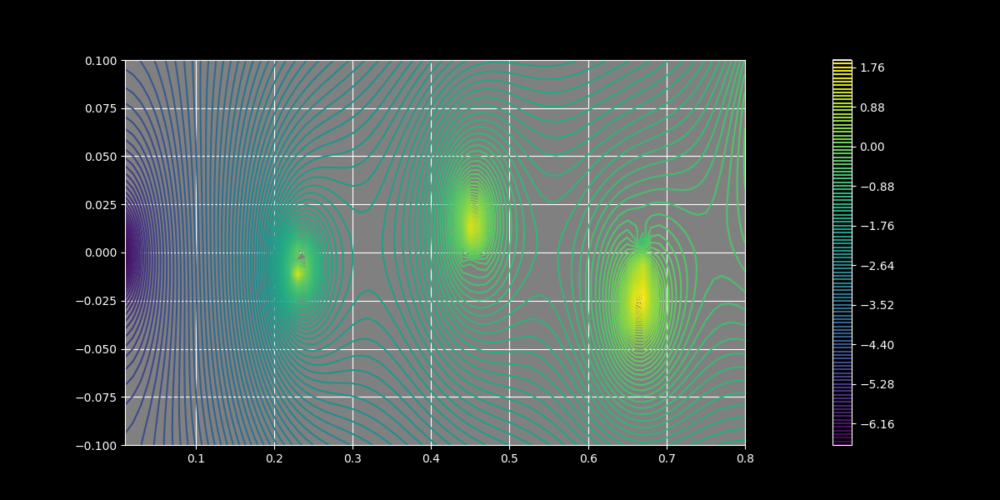

In [36]:
plotlogf(C1, .01, .8, -.1, .1, iref=80, rref=80, levels=120)

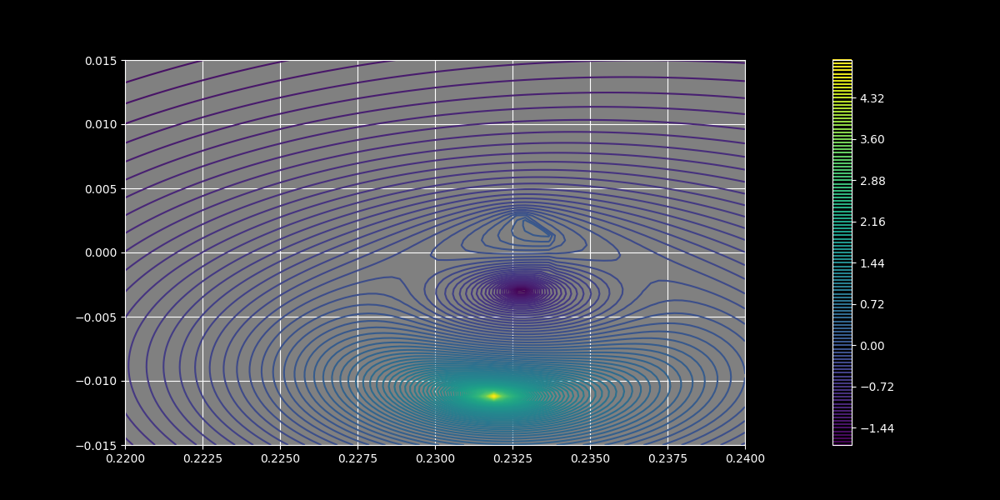

In [37]:
plotlogf(C1, .22, .24, -.015, .015, iref=80, rref=80, levels=120)

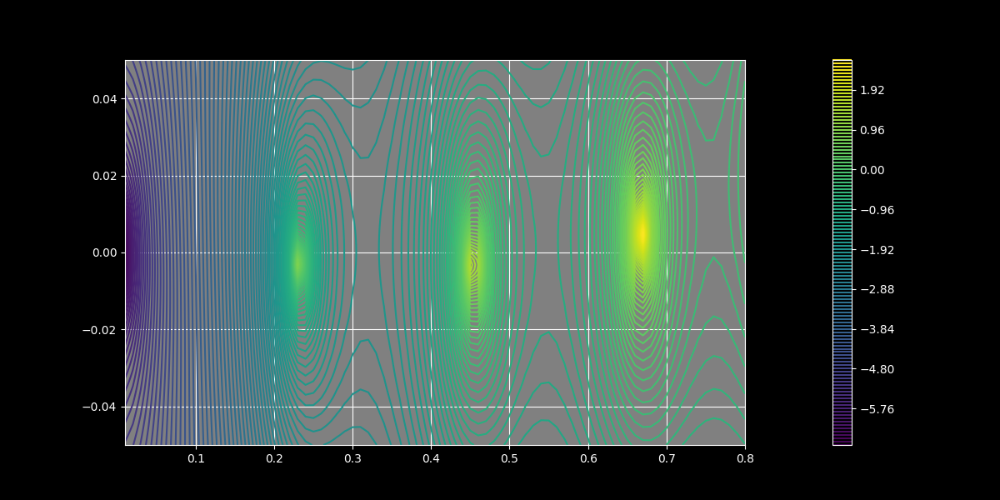

In [41]:
plotlogf(M12, .01, .8, -.05, .05, iref=80, rref=80, levels=120)

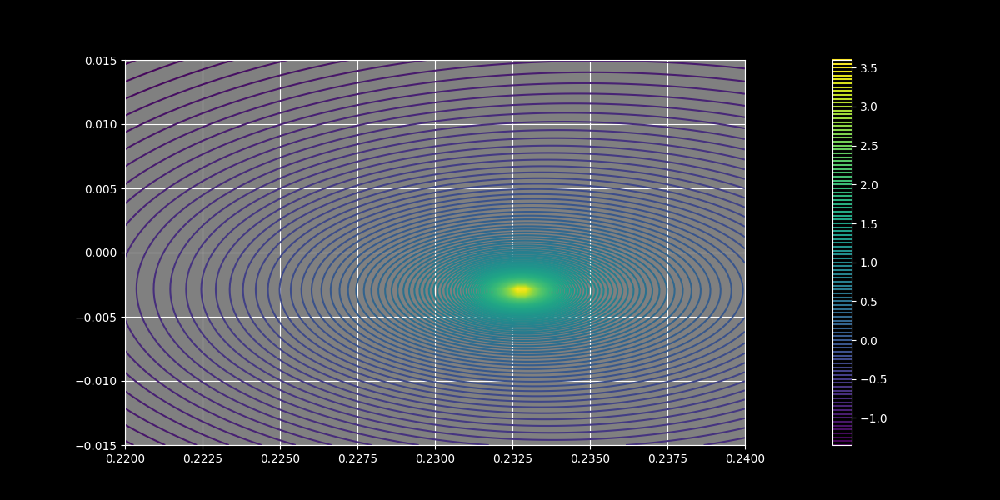

In [42]:
plotlogf(M12, .22, .24, -.015, .015, iref=80, rref=80, levels=120)

Right, b - M12 has a pole at zeros of M12, since b is infinite there.  This becomes a zero in reciprocal, which is what goes in to radiation modes.